# Ridge Regression - EOFs

In [1]:
import datetime as dt 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import netCDF4 as nc
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from sklearn import metrics
from sklearn.linear_model import Ridge


from eofs.xarray import Eof

from utils import *

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Training and testing sets
train_files = ["historical", "ssp126", "ssp370", "ssp585"]
X_train, eof_solvers = create_predictor_data(train_files)
y_train = xr.open_dataset('/glade/u/home/ianderson/train_test/y_train_outputs.nc')

X_test = get_test_data('ssp245', eof_solvers)
y_test = xr.open_dataset('/glade/u/home/ianderson/train_test/y_test_outputs.nc')

In [3]:
def ridge_EOFs_bestridge(variable, want_rmse, want_coefs):
    
    var_truth = y_test[variable]
    alpha_vals = [0.00001, 0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5, 0.8, 1.0, 5.0, 10, 100]
    y_train_var = y_train[variable].values.reshape(-1, 192 * 288)
    rmse_mean_vals = []
    
    for i in range(len(alpha_vals)):
        
        initial_ridge = Ridge(alpha_vals[i])
        ridge_var = initial_ridge.fit(X_train, y_train_var)
        
        r_var = ridge_var.predict(X_test)
        r_out_var = r_var.reshape(86, 192, 288)
        
        rmse1 = get_rmse(var_truth[35], r_out_var[35]).mean()
        rmse2 = get_rmse(var_truth[85], r_out_var[85]).mean()
        rmse3 = get_rmse(var_truth[30:41], r_out_var[30:41]).mean()
        rmse4 = get_rmse(var_truth[75:], r_out_var[75:]).mean()
        rmse5 = get_rmse(var_truth[35:], r_out_var[35:]).mean()
        
        rmse_list = [rmse1, rmse2, rmse3, rmse4, rmse5]
        mean_rmse = sum(rmse_list) / len(rmse_list)
        rmse_mean_vals.append(mean_rmse)
        
        min_idx = rmse_mean_vals.index(min(rmse_mean_vals))
    
        model = Ridge(alpha_vals[min_idx])
        model.fit(X_train, y_train_var)
    
        m_var = model.predict(X_test)
        
        m_out_var = m_var.reshape(86, 192, 288)

        xr_output=xr.Dataset(coords={'year': y_test.year.values, 'lat': y_test.lat.values, 'lon': y_test.lon.values})
        xr_output[variable]=(['year', 'lat', 'lon'],  m_out_var)
        
        # Getting coefficients
        var_coef = model.coef_
        
    if want_rmse == True:
        print(f"Best alpha={alpha_vals[min_idx]}")
        print(f"RMSE at 2050: {get_rmse(var_truth[35], m_out_var[35]).mean()}")
        print(f"RMSE at 2100: {get_rmse(var_truth[85], m_out_var[85]).mean()}")
        print(f"RMSE 2045-2055: {get_rmse(var_truth[30:41], m_out_var[30:41]).mean()}")
        print(f"RMSE 2090-2100: {get_rmse(var_truth[75:], m_out_var[75:]).mean()}")
        print(f"RMSE 2050-2100: {get_rmse(var_truth[35:], m_out_var[35:]).mean()}")
        
        
    if want_coefs == True:
        return xr_output, var_coef
    
    else:
        return xr_output

In [4]:
feature_names=['CO2', 'CH4', 'BC_0', 'BC_1', 'BC_2', 'BC_3', 'BC_4', 'SO2_0', 'SO2_1', 'SO2_2', 'SO2_3', 'SO2_4']
lat_vals = y_train['lat']
lon_vals = y_train['lon']

def coefficients(variable):
    
    coef1 = ridge_EOFs_bestridge(variable, False, True)[1]
    coef = coef1.reshape(192, 288, 12)
    
    coefs = np.mean(coef1, axis=0)
    print(coefs)

    plt.figure(figsize=(8, 6))
    plt.bar(range(len(coefs)), coefs)
    plt.xlabel('Feature Index')
    plt.ylabel('Coefficient Value')
    plt.title(f'Ridge regression coefficients - {variable}')
    plt.xticks(range(len(coefs)), [f'{feature_names[i]}' for i in range(len(feature_names))])
    plt.show()
    
    
    
def spatial_coefficients_plots(variable):
    
    variable_coef = ridge_EOFs_bestridge(variable, False, True)[1] # shape is (55296, 12)
    variable_coef2 = variable_coef.reshape(192, 288, 12)
    
    for i in range(len(feature_names)):
    
        plt.figure(figsize=(10, 10))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.LAND, edgecolor='black')
        
        max_abs_coef = np.max(np.abs(variable_coef2[:, :, i]))

        levels = np.linspace(-max_abs_coef, max_abs_coef, 61)
        plt.contourf(lon_vals, lat_vals, variable_coef2[:, :, i], levels=levels, cmap='RdBu_r')

        cbar = plt.colorbar(ax=ax, label='coefficient values', orientation='horizontal', shrink=0.8, pad=0.02)

        plt.title(f"Coefficients - {feature_names[i]}")
        plt.show()

### `tas` - surface temperature

In [6]:
ridge_EOFs_bestridge('tas', True, False)

Best alpha=1e-05
RMSE at 2050: 0.5332922188995706
RMSE at 2100: 1.1370277106045816
RMSE 2045-2055: 0.5910673397260475
RMSE 2090-2100: 1.099216179348938
RMSE 2050-2100: 0.7984704131772952


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    tas      (year, lat, lon) float64 1.723 1.723 1.723 ... 7.217 7.217 7.217

[ 6.84674503 -6.6145298   2.89393401  2.81919483 -0.73494954 -0.21688547
  0.38176833 -2.66073996  0.12198347 -0.48292172  0.16545899  0.57961974]


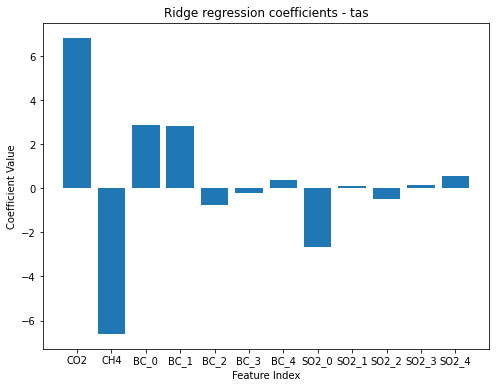

In [7]:
coefficients('tas')

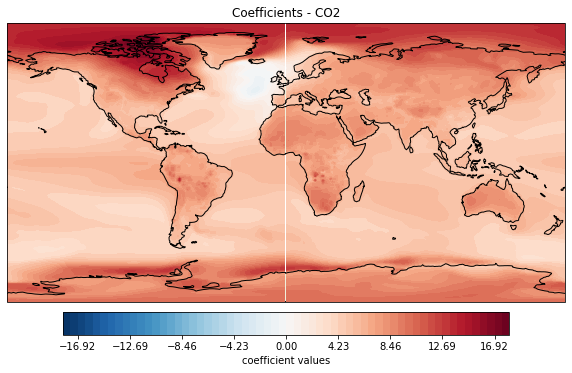

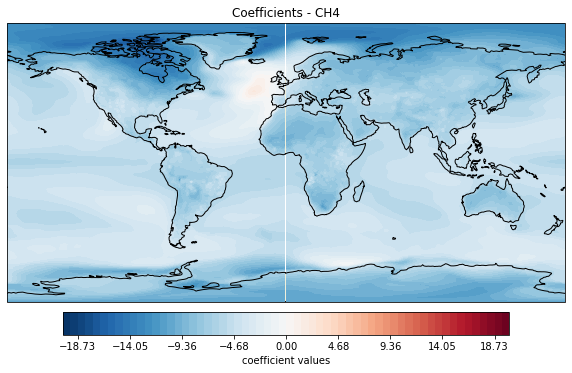

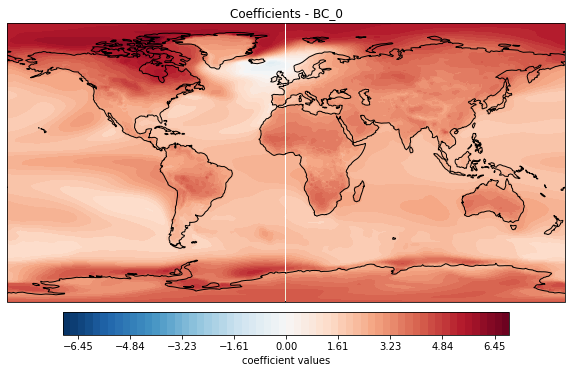

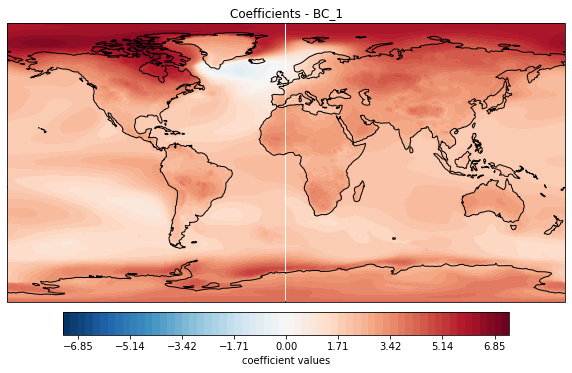

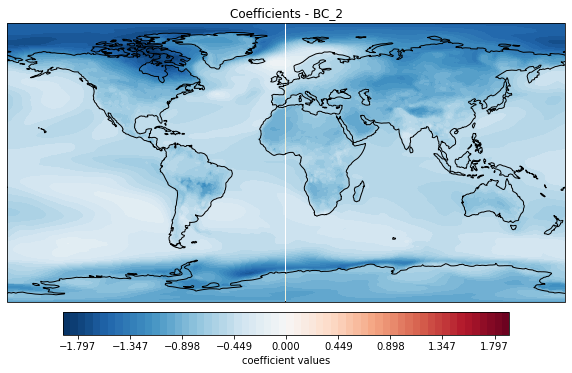

...

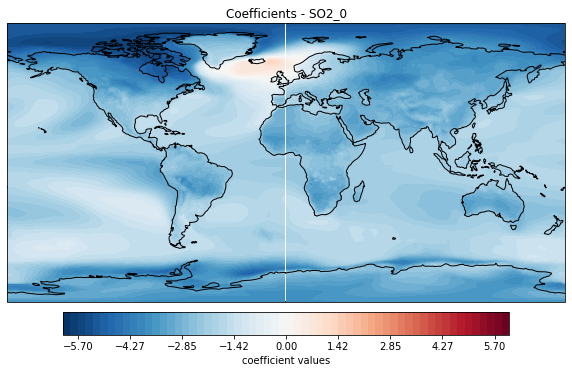

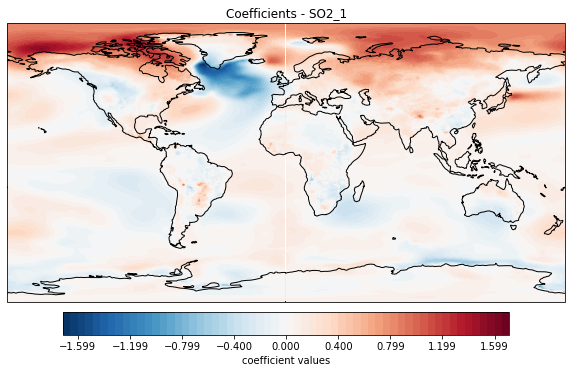

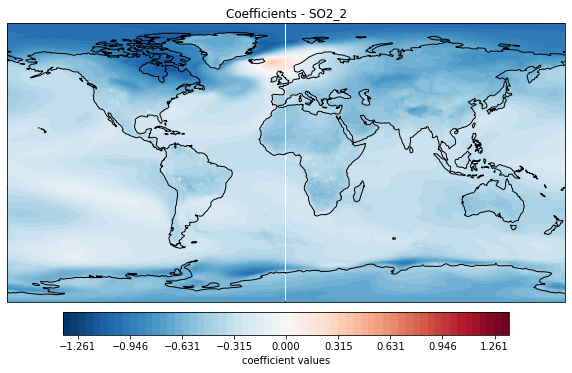

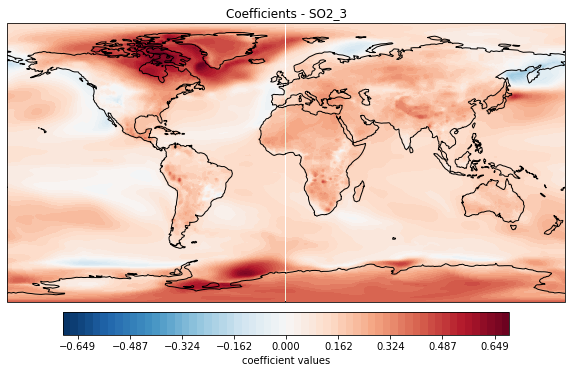

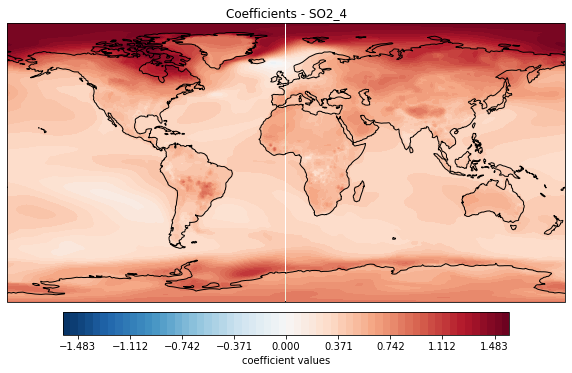

In [10]:
spatial_coefficients_plots('tas')

### `pr` - precipitation

In [11]:
ridge_EOFs_bestridge('pr', True, False)

Best alpha=100
RMSE at 2050: 0.39932509376096825
RMSE at 2100: 0.7072897785518936
RMSE 2045-2055: 0.5379366713893106
RMSE 2090-2100: 0.6918460910652221
RMSE 2050-2100: 0.632712988685972


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    pr       (year, lat, lon) float64 -0.008416 -0.008416 ... 0.09218 0.09218

[ 0.01533294  0.00497545  0.00787811  0.03280018 -0.00824846 -0.00510011
 -0.00590972  0.00681253 -0.01171864  0.00639205 -0.01382804 -0.00521036]


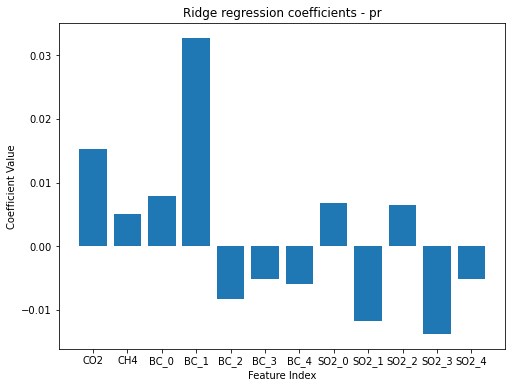

In [12]:
coefficients('pr')

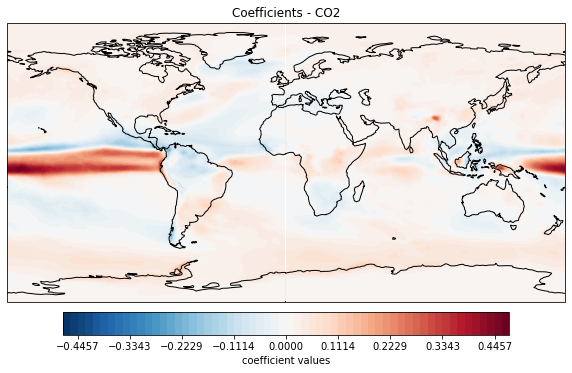

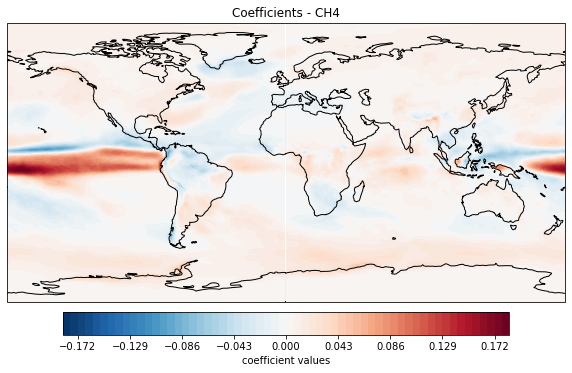

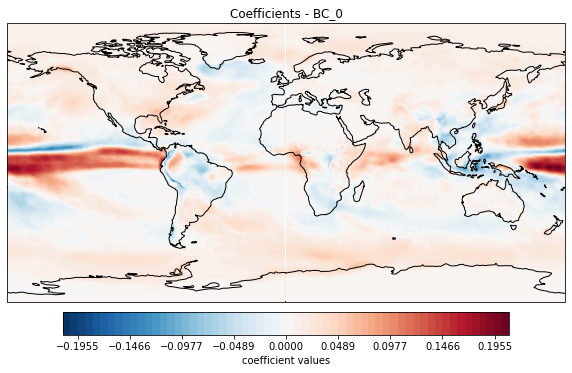

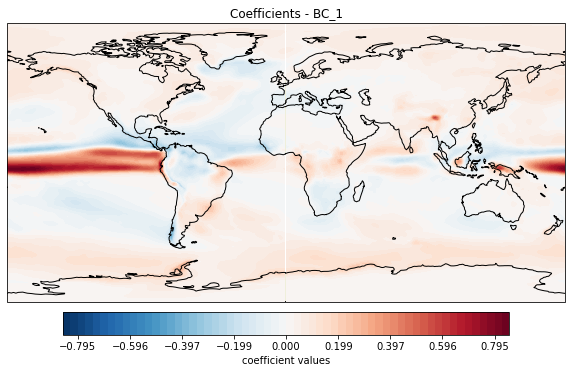

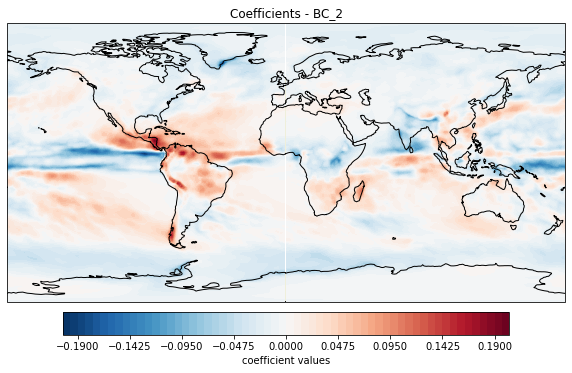

...

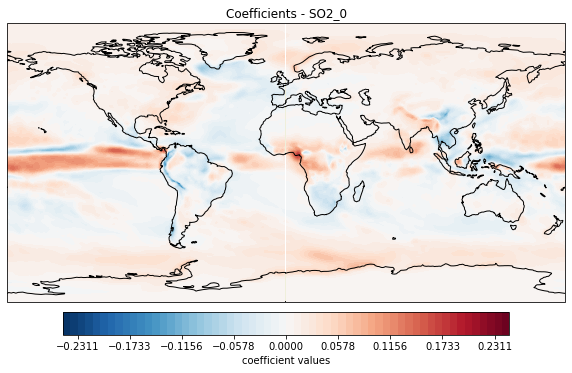

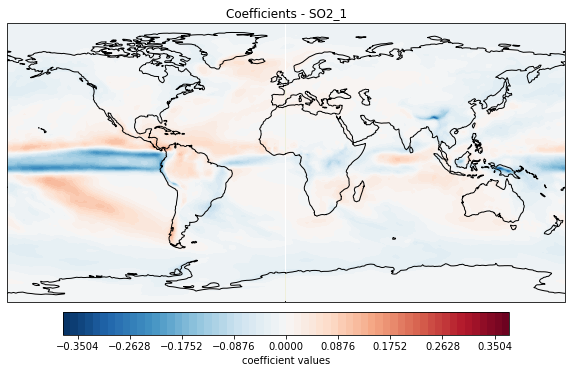

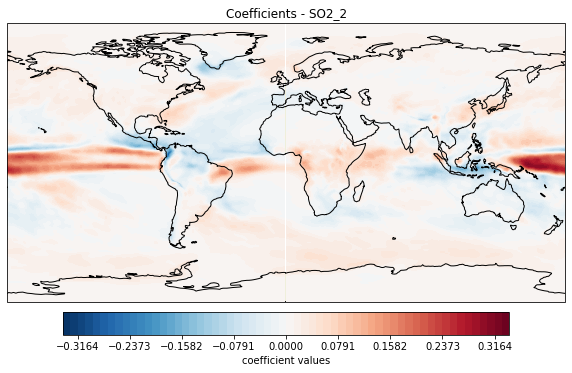

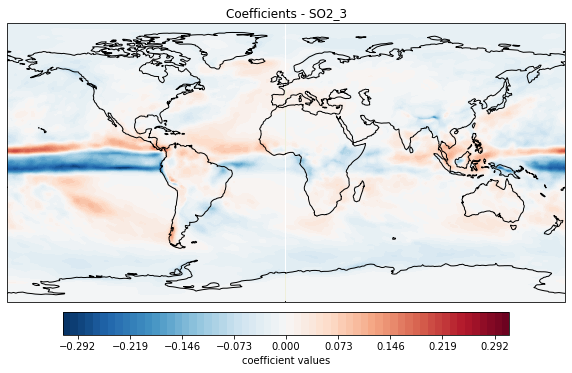

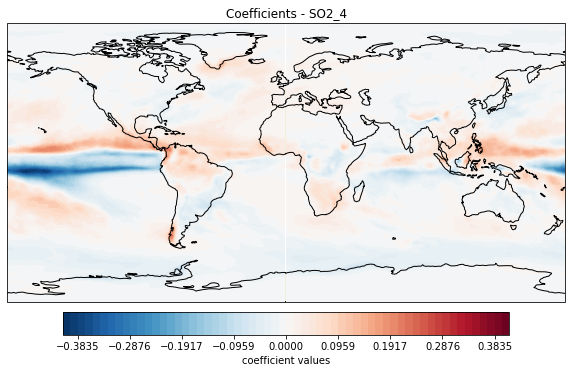

In [13]:
spatial_coefficients_plots('pr')

### `huss` - near-surface specific humidity

In [14]:
ridge_EOFs_bestridge('huss', True, False)

Best alpha=1e-05
RMSE at 2050: 0.000294885168713638
RMSE at 2100: 0.0006877770981648363
RMSE 2045-2055: 0.0003568054642859422
RMSE 2090-2100: 0.0007020346156701944
RMSE 2050-2100: 0.0005113059527399213


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    huss     (year, lat, lon) float64 3.127e-05 3.127e-05 ... 0.0006142

[ 3.01261545e-03 -3.09793074e-03  1.34882262e-03  1.23967366e-03
 -3.15888361e-04 -1.12224934e-04  1.63051989e-04 -1.23651282e-03
  1.54806756e-05 -2.19236195e-04  9.17230066e-05  2.30578007e-04]


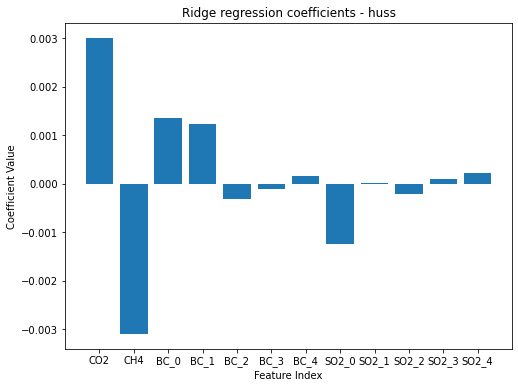

In [15]:
coefficients('huss')

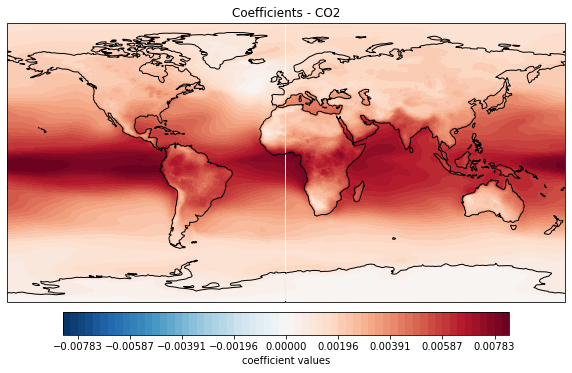

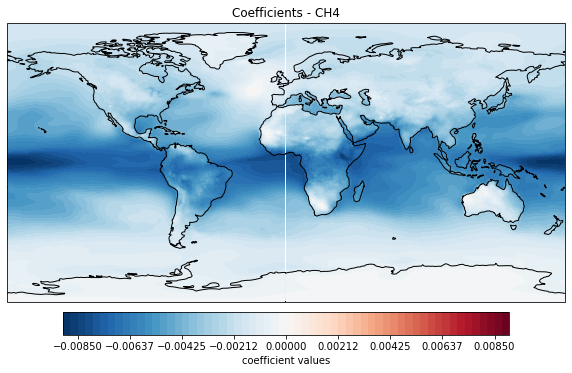

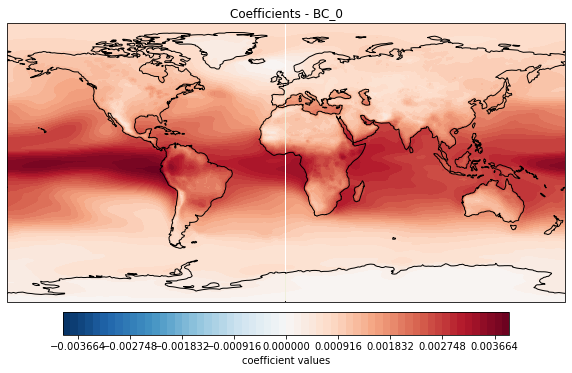

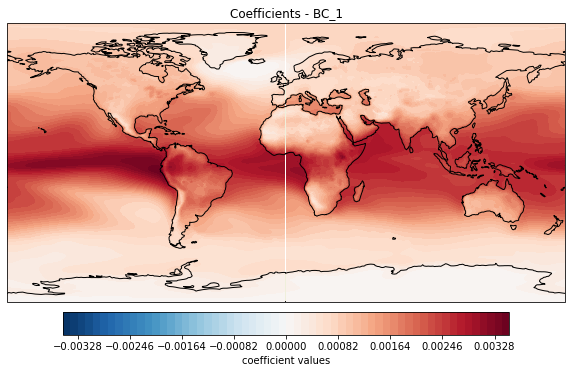

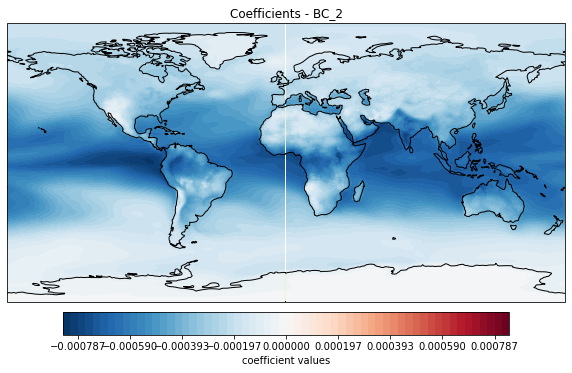

...

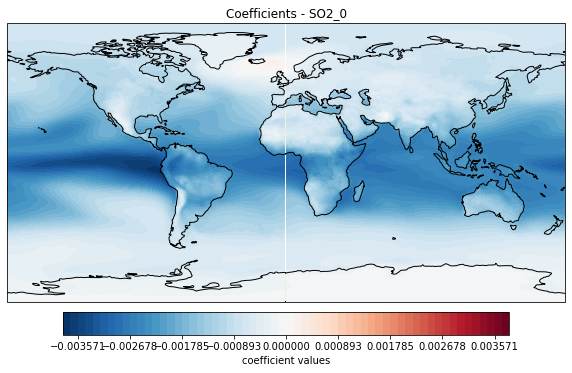

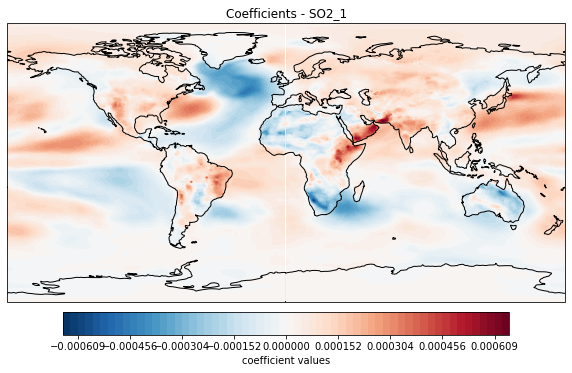

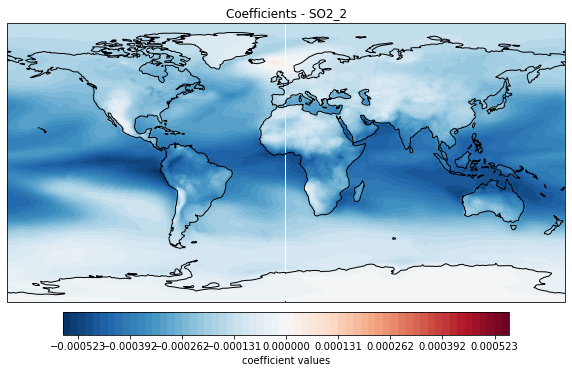

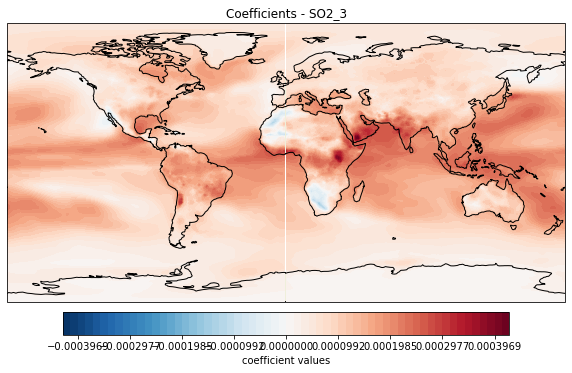

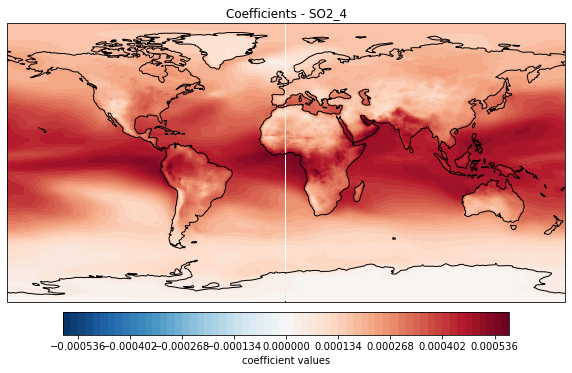

In [16]:
spatial_coefficients_plots('huss')

### `hurs` - near-surface relative humidity

In [17]:
ridge_EOFs_bestridge('hurs', True, False)

Best alpha=0.01
RMSE at 2050: 1.2607974228954126
RMSE at 2100: 1.2902628350253718
RMSE 2045-2055: 1.3355083140290882
RMSE 2090-2100: 1.4386079372024452
RMSE 2050-2100: 1.3782921112448168


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    hurs     (year, lat, lon) float64 0.06683 0.06677 0.06683 ... -4.855 -4.855

[-1.20488232  1.17485917 -0.58701039 -0.62367946  0.16440694  0.06245093
 -0.06041191  0.59506729 -0.06787871  0.1190647  -0.02283371 -0.14109242]


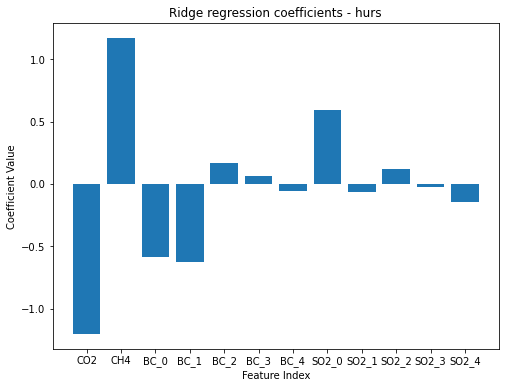

In [21]:
coefficients('hurs')

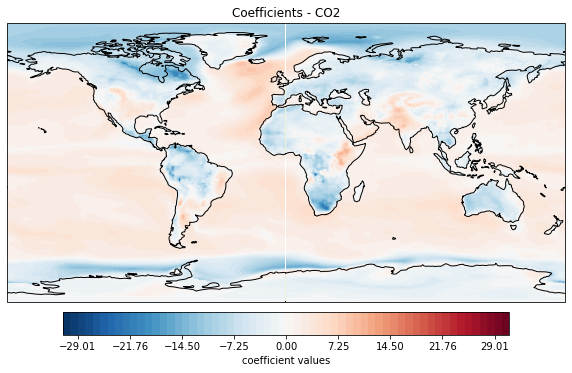

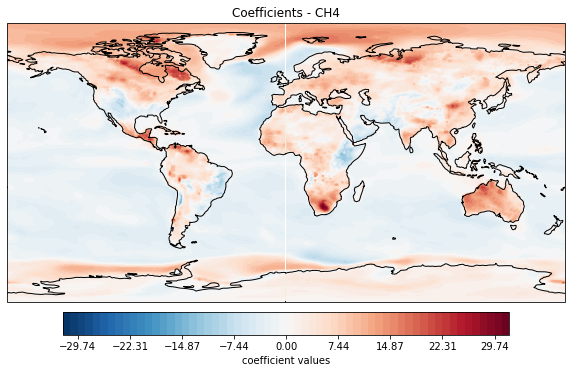

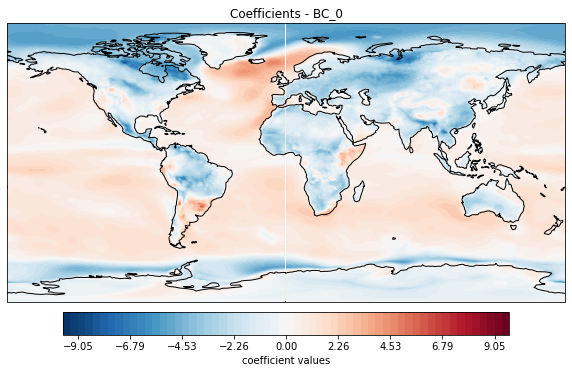

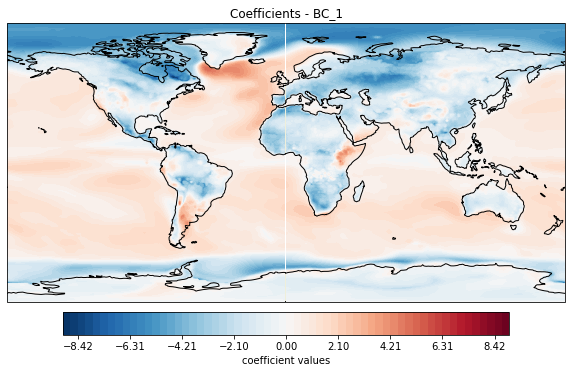

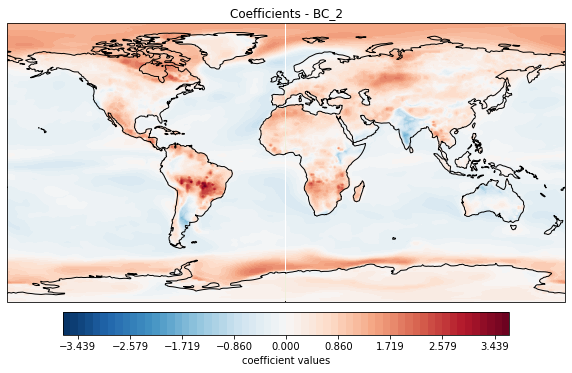

...

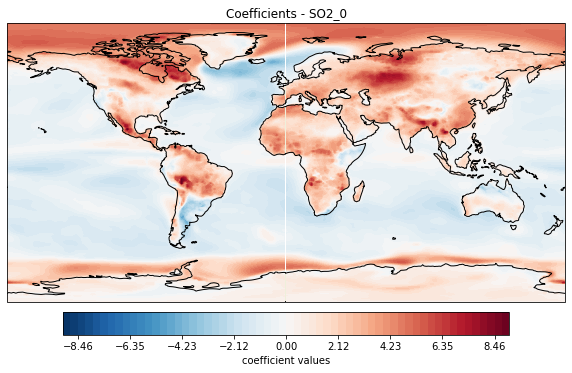

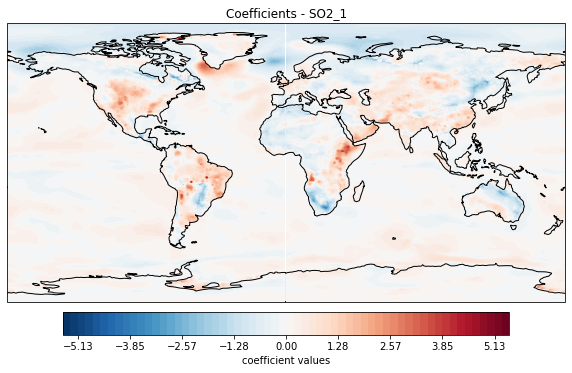

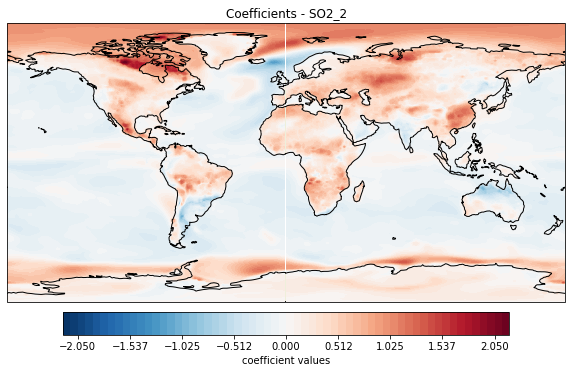

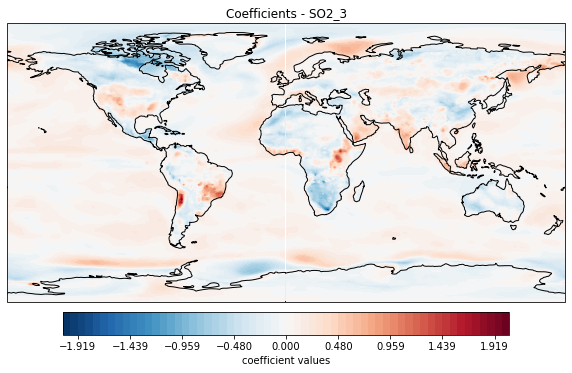

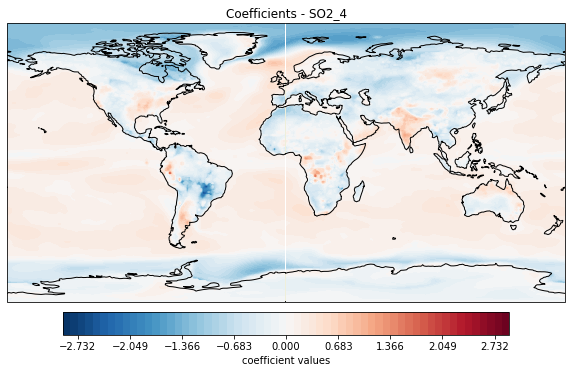

In [22]:
spatial_coefficients_plots('hurs')

### `rlds` - longwave radiation

In [23]:
ridge_EOFs_bestridge('rlds', True, False)

Best alpha=1e-05
RMSE at 2050: 3.047060476905491
RMSE at 2100: 6.4881448067777905
RMSE 2045-2055: 3.6708042193114037
RMSE 2090-2100: 6.447635575025687
RMSE 2050-2100: 4.815219064290613


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    rlds     (year, lat, lon) float64 6.106 6.106 6.106 ... 37.08 37.08 37.09

[ 40.58437426 -38.18236545  16.4165045   15.9520114   -4.3715878
  -0.82654573   2.45789643 -15.08313623   0.62238297  -2.66026494
   0.98396669   3.30067539]


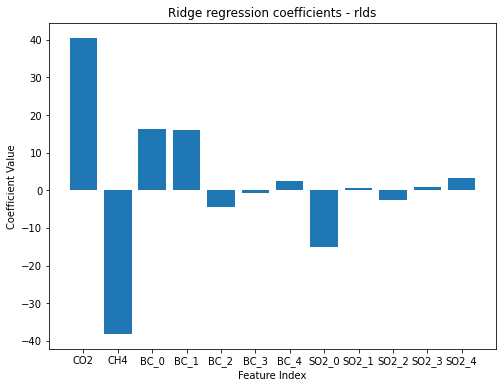

In [24]:
coefficients('rlds')

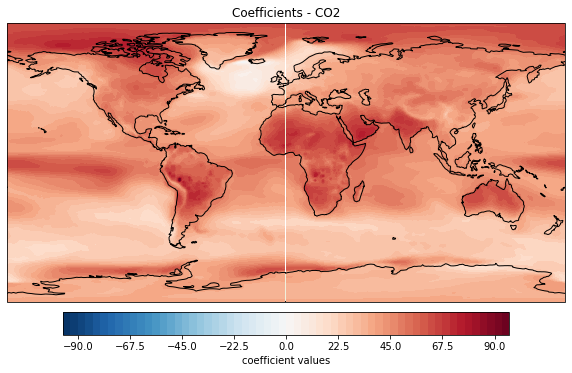

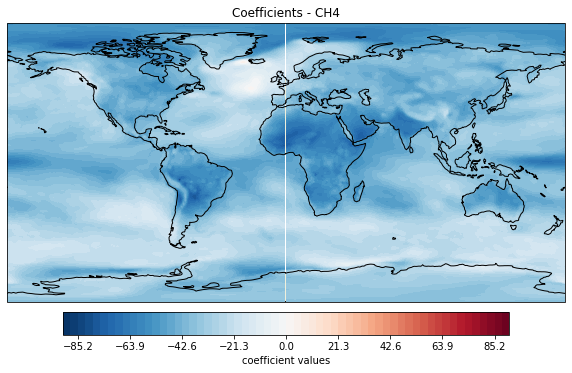

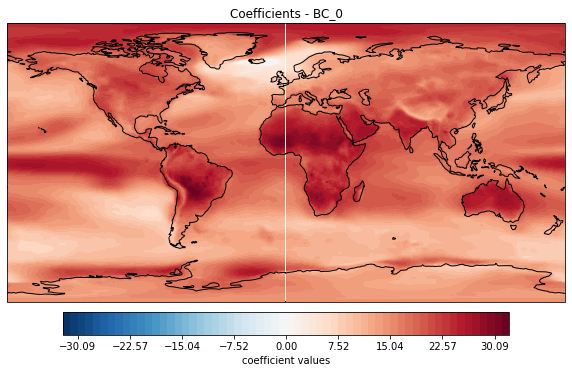

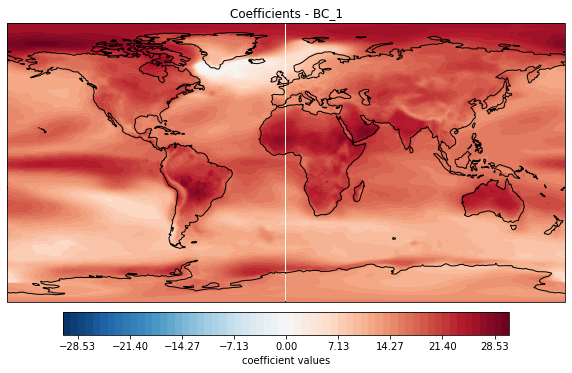

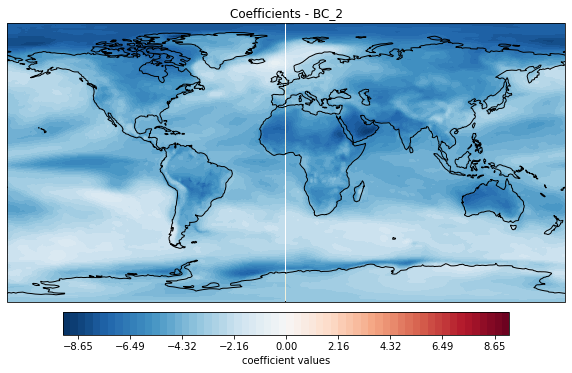

...

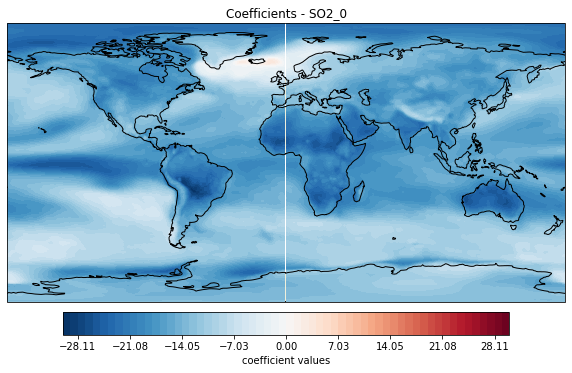

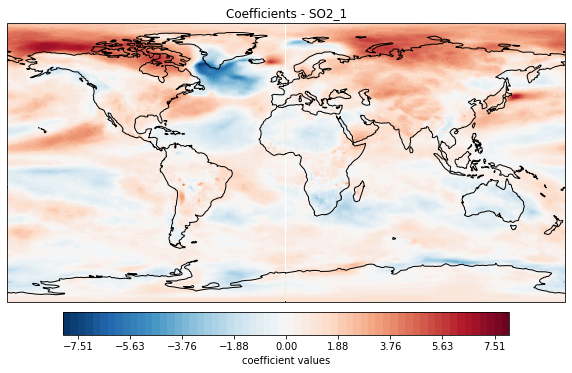

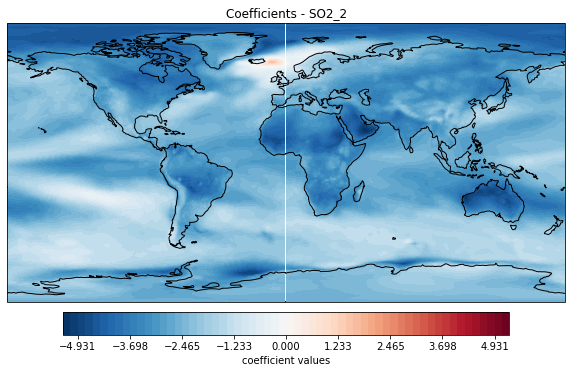

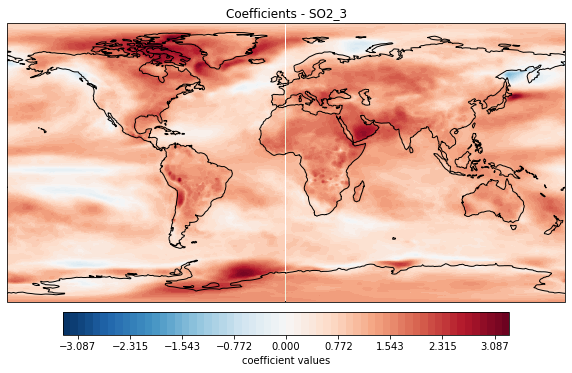

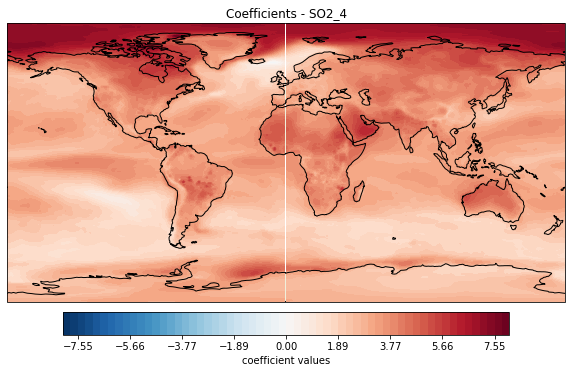

In [25]:
spatial_coefficients_plots('rlds')

### `rsds` - shortwave radiation

In [26]:
ridge_EOFs_bestridge('rsds', True, False)

Best alpha=100
RMSE at 2050: 4.165111066212623
RMSE at 2100: 6.228593315105004
RMSE 2045-2055: 4.77252028572288
RMSE 2090-2100: 6.018935693327571
RMSE 2050-2100: 5.33699800913178


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    rsds     (year, lat, lon) float64 0.1393 0.1391 0.1392 ... -16.21 -16.21

[-0.32536007 -0.14914449 -0.12167908 -0.64805593  0.43549239 -0.64861536
 -0.54648885 -0.3138756  -0.01423526 -0.33021684  0.08210063  0.39877603]


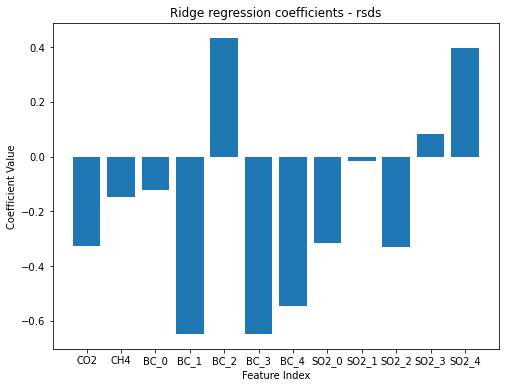

In [27]:
coefficients('rsds')

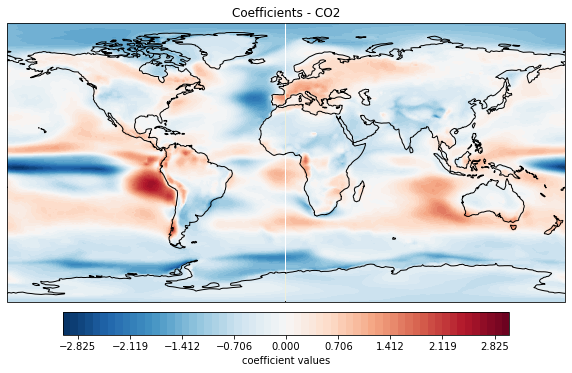

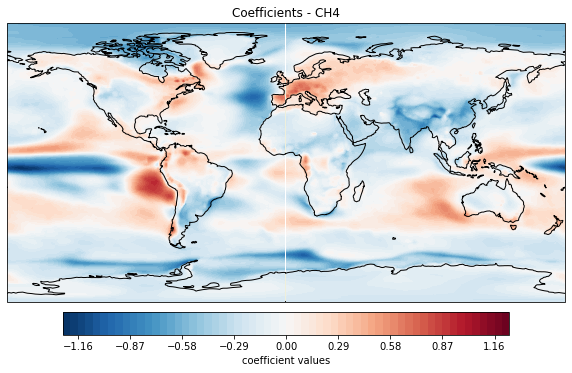

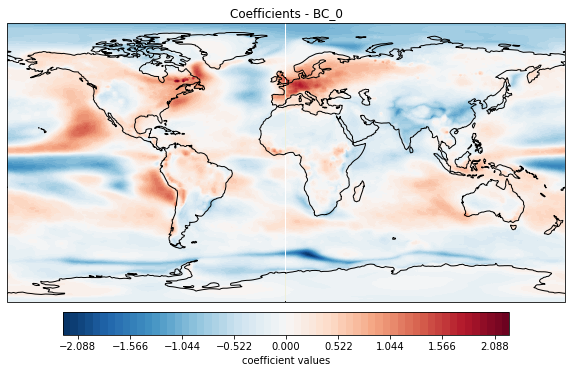

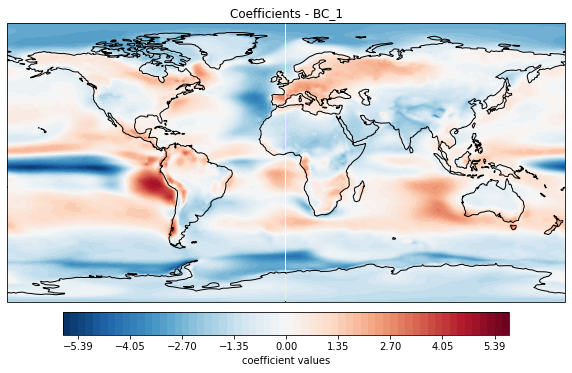

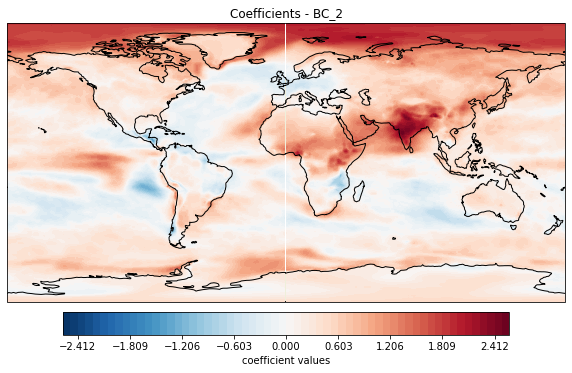

...

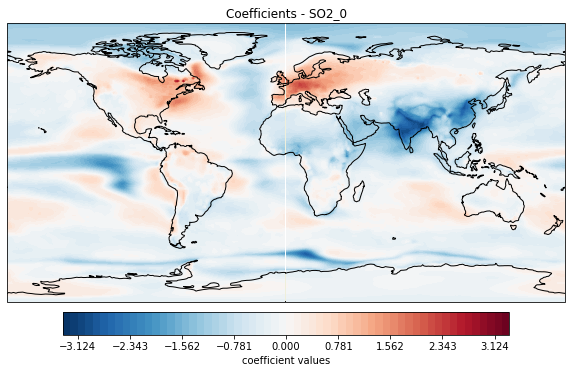

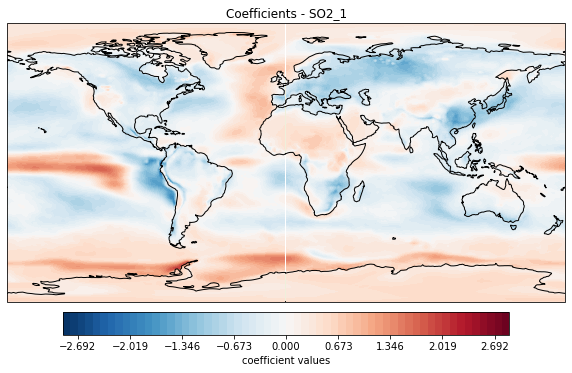

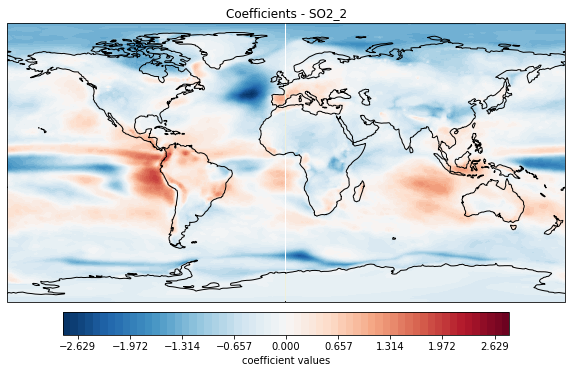

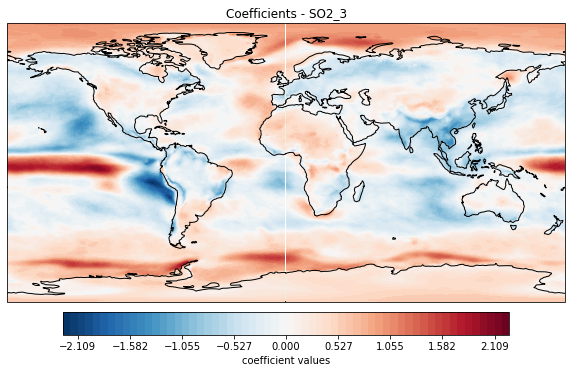

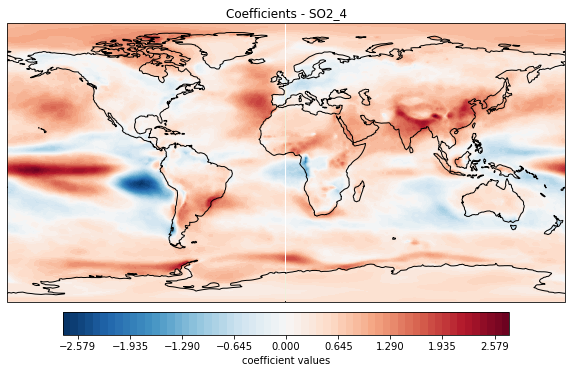

In [28]:
spatial_coefficients_plots('rsds')

### `sfcWind` - wind speed

In [29]:
ridge_EOFs_bestridge('sfcWind', True, False)

Best alpha=100
RMSE at 2050: 0.17675191046730293
RMSE at 2100: 0.23592900394200703
RMSE 2045-2055: 0.21405453700183327
RMSE 2090-2100: 0.250912022025722
RMSE 2050-2100: 0.24023708111351189


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    sfcWind  (year, lat, lon) float64 0.04917 0.04917 0.04917 ... 0.4845 0.4845

[ 0.00103012  0.00047297  0.00232445  0.00219596 -0.00360465  0.00348383
  0.0004266   0.00120278  0.00242126  0.00315203 -0.0034569   0.00075979]


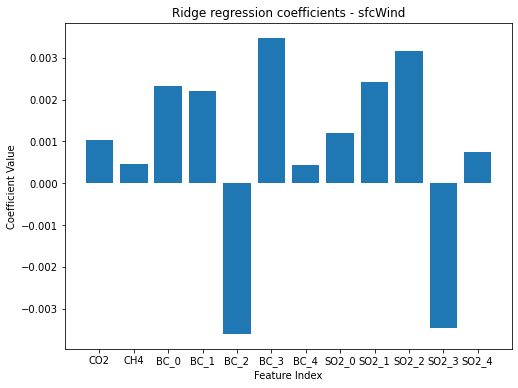

In [30]:
coefficients('sfcWind')

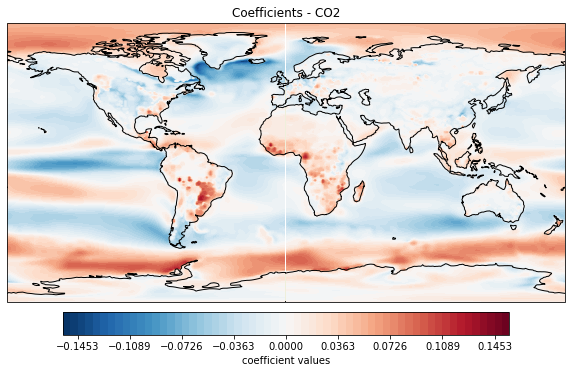

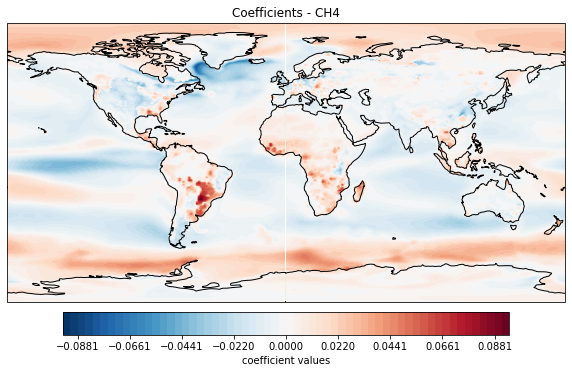

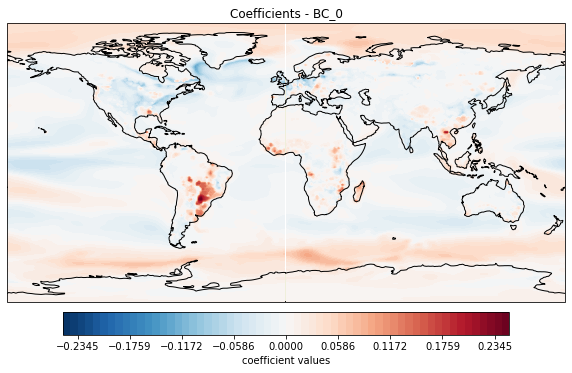

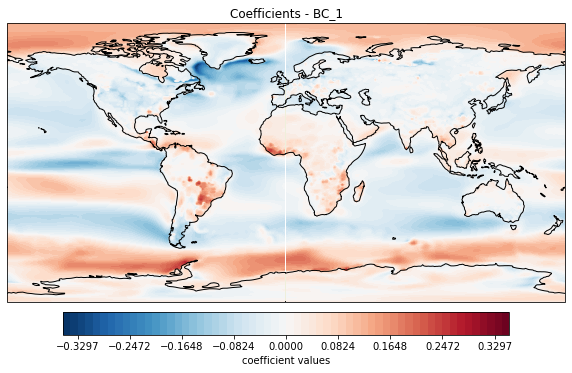

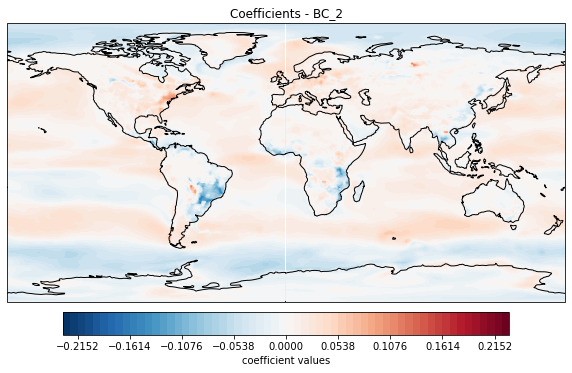

...

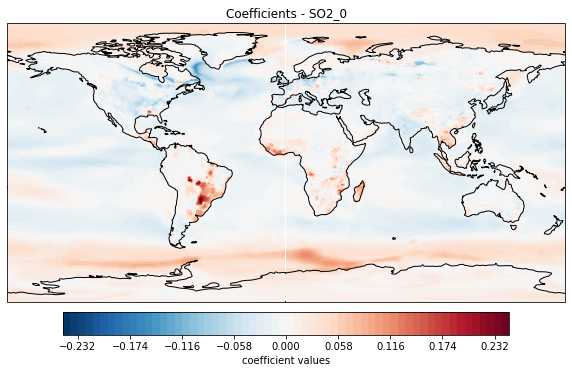

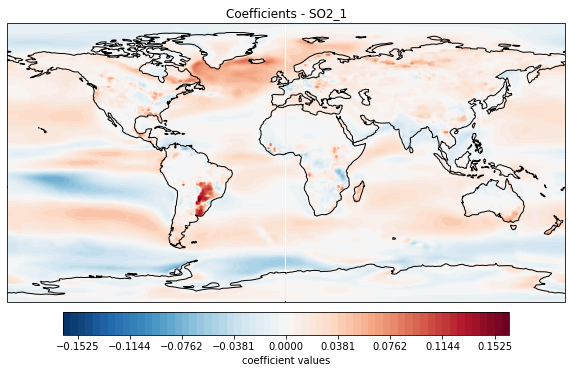

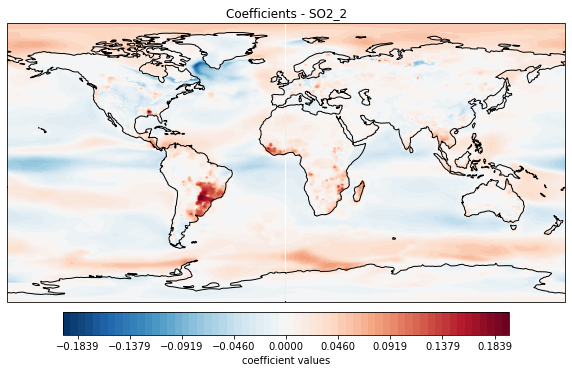

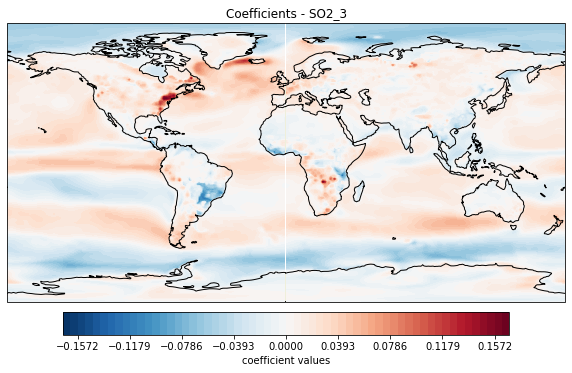

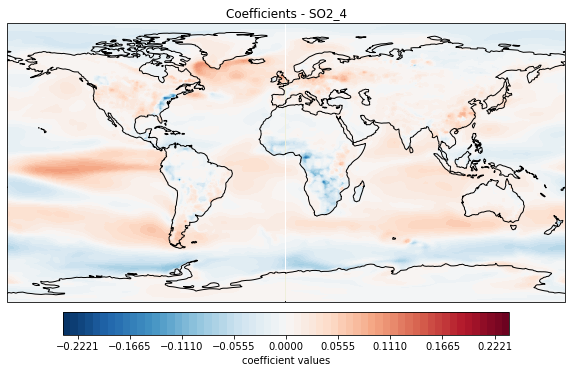

In [31]:
spatial_coefficients_plots('sfcWind')

### `ps` - surface pressure

In [32]:
ridge_EOFs_bestridge('ps', True, False)

Best alpha=0.005
RMSE at 2050: 69.06642109569519
RMSE at 2100: 105.01627114650283
RMSE 2045-2055: 83.97702701234249
RMSE 2090-2100: 97.9163126144787
RMSE 2050-2100: 93.35374301601914


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    ps       (year, lat, lon) float64 14.85 14.85 14.85 ... -198.1 -198.1 -198.1

[  92.50833641 -116.18511422   52.75518797   43.40521509  -10.60267122
   -3.81187465    2.35211809  -48.64764358   -4.59977575   -8.96411025
    6.04213472    8.36899011]


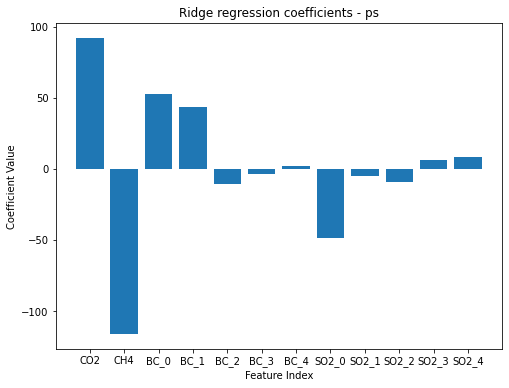

In [33]:
coefficients('ps')

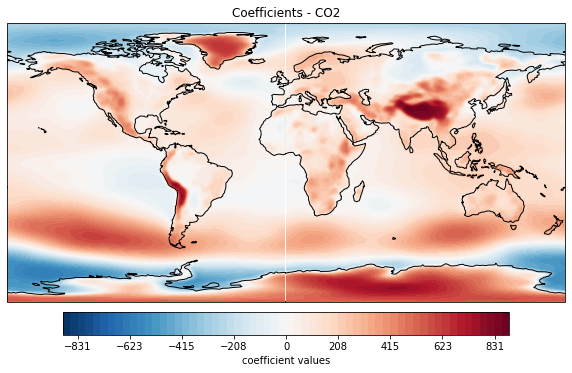

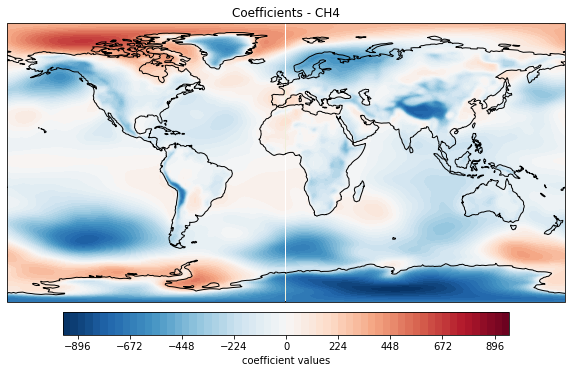

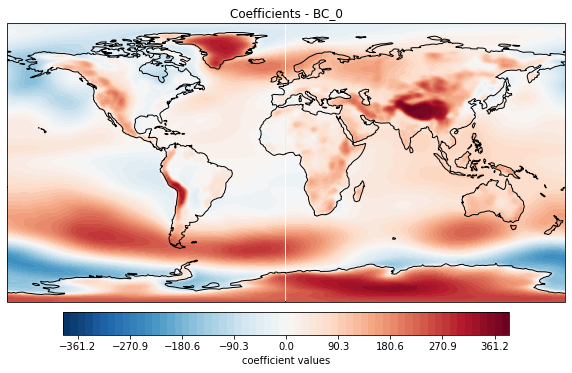

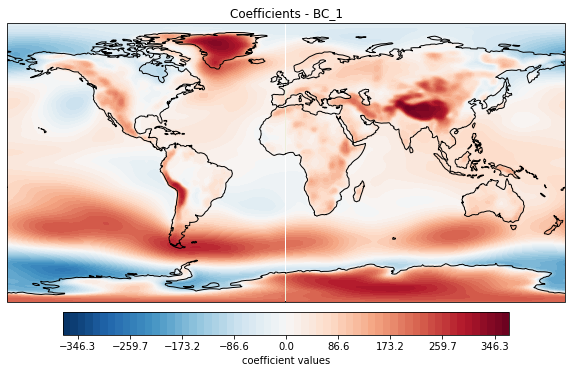

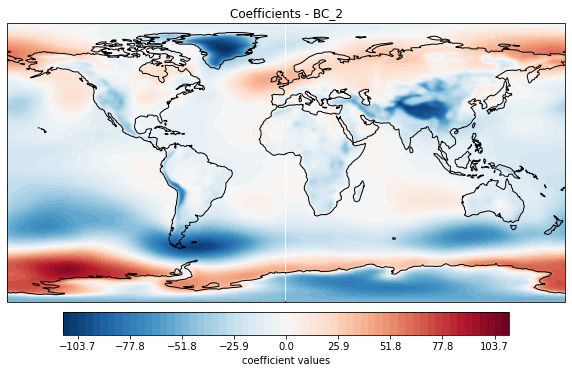

...

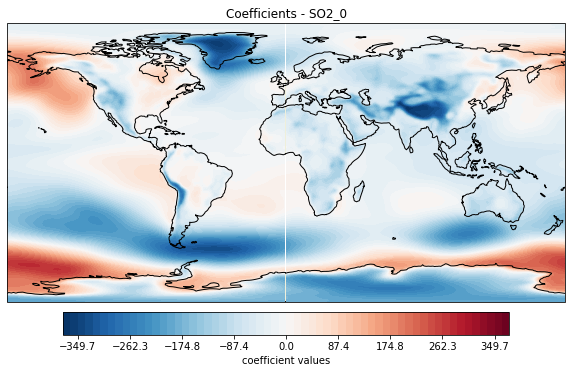

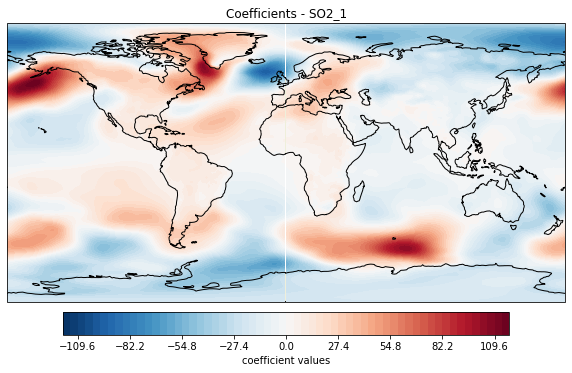

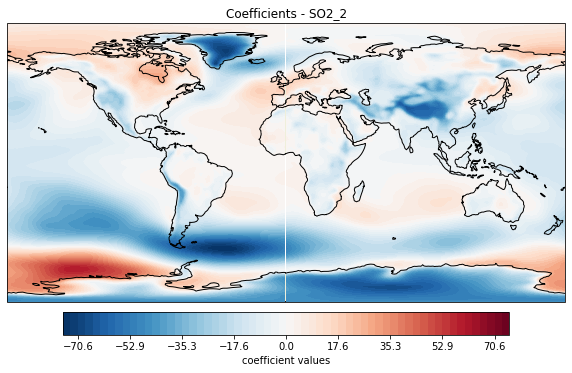

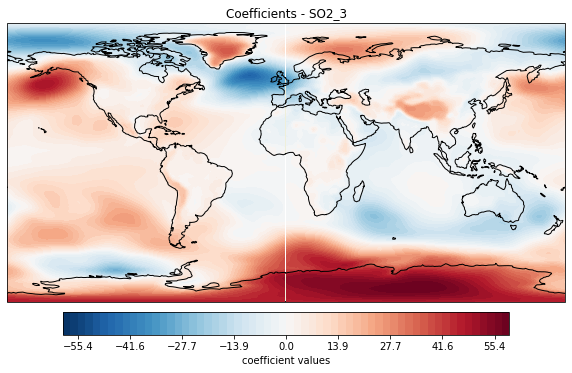

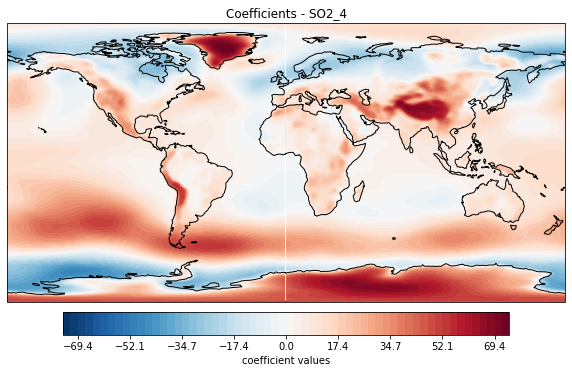

In [34]:
spatial_coefficients_plots('ps')

### `mrsos` - land-surface moisture

In [16]:
# `mrsos` separate due to dimensionality differences
y_train_mrsos_flattened = y_train['mrsos'].stack(z=("lat", "lon")).dropna('z')
mrsos_truth = y_test['mrsos']

model = Ridge(alpha = 100)
model.fit(X_train, y_train_mrsos_flattened)

y_pred_flattened = model.predict(X_test)

y_pred_unstacked = xr.DataArray(y_pred_flattened, dims=("year", "z"), coords={'z': y_train_mrsos_flattened.z, "year":X_test.index})
m_out_mrsos = y_pred_unstacked.unstack("z")
        
common_lat_values = np.intersect1d(mrsos_truth['lat'], m_out_mrsos['lat'])
mrsos_truth = mrsos_truth.sel(lat=common_lat_values)
        
xr_output=xr.Dataset(coords={'year': y_test.year.values, 'lat': mrsos_truth.lat.values, 'lon': y_test.lon.values})
xr_output['mrsos']=(['year', 'lat', 'lon'],  m_out_mrsos.data)
        
# Getting coefficients
var_coef = model.coef_

print(f"RMSE at 2050: {get_rmse(mrsos_truth[35], m_out_mrsos[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(mrsos_truth[85], m_out_mrsos[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(mrsos_truth[30:41], m_out_mrsos[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(mrsos_truth[75:], m_out_mrsos[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(mrsos_truth[35:], m_out_mrsos[35:]).mean()}")

RMSE at 2050: 1.866456699562719
RMSE at 2100: 3.063551901771622
RMSE 2045-2055: 1.9573973671241673
RMSE 2090-2100: 2.912497948121271
RMSE 2050-2100: 2.458828071128951


[-0.25541028 -0.11768764 -0.05139263 -0.34646223 -0.05543815  0.07767657
  0.08801717 -0.11145758  0.13555344 -0.03915489  0.01803145  0.23179163]


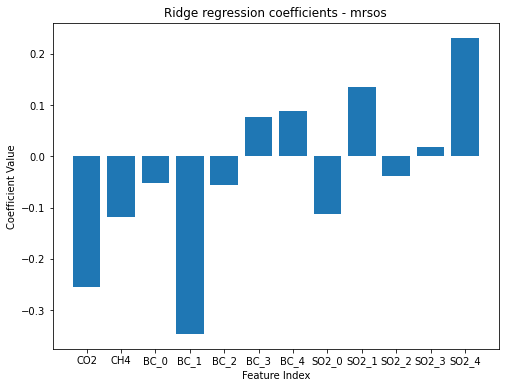

In [34]:
feature_names=['CO2', 'CH4', 'BC_0', 'BC_1', 'BC_2', 'BC_3', 'BC_4', 'SO2_0', 'SO2_1', 'SO2_2', 'SO2_3', 'SO2_4']
    
coefs = np.mean(var_coef, axis=0)
print(coefs)

plt.figure(figsize=(8, 6))
plt.bar(range(len(coefs)), coefs)
plt.xlabel('Feature Index')
plt.ylabel('Coefficient Value')
plt.title('Ridge regression coefficients - mrsos')
plt.xticks(range(len(coefs)), [f'{feature_names[i]}' for i in range(len(feature_names))])
plt.show()

In [27]:
c1 = xr.DataArray(var_coef, dims=("z", "input"), coords={'z': y_train_mrsos_flattened.z, "input":[i for i in range(1,13)]})
c2 = c1.unstack("z")

In [33]:
c3 = c2.transpose('lat', 'lon', 'input')
c3.shape

(175, 288, 12)

TypeError: Length of y (192) must match number of rows in z (175)

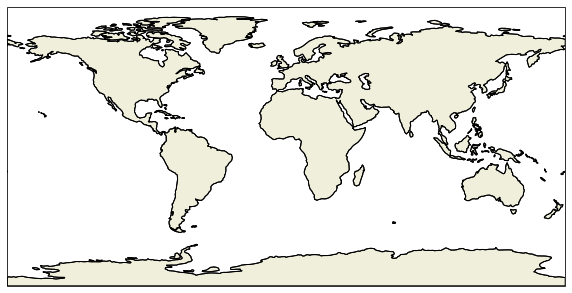

In [35]:
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.LAND, edgecolor='black')
        
    max_abs_coef = np.max(np.abs(c3[:, :, i]))

    levels = np.linspace(-max_abs_coef, max_abs_coef, 61)
    plt.contourf(lon_vals, lat_vals, c3[:, :, i], levels=levels, cmap='RdBu_r')

    cbar = plt.colorbar(ax=ax, label='coefficient values', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"Coefficients - {feature_names[i]}")
    plt.show()

## `evspsbl`

In [35]:
ridge_EOFs_bestridge('evspsbl', True, False)

Best alpha=100
RMSE at 2050: 1.505083765927828e-06
RMSE at 2100: 2.765190607845218e-06
RMSE 2045-2055: 1.618930311602326e-06
RMSE 2090-2100: 2.711805934814538e-06
RMSE 2050-2100: 2.231347443888767e-06


<xarray.Dataset>
Dimensions:  (year: 86, lat: 192, lon: 288)
Coordinates:
  * year     (year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
Data variables:
    evspsbl  (year, lat, lon) float64 -1.034e-08 -1.035e-08 ... 5.308e-07

[ 1.84355325e-07  8.99569055e-08  3.48620224e-08  2.56597142e-07
  2.20367218e-08 -4.48699378e-08 -7.63308586e-08  8.65775021e-08
 -8.56195136e-08  5.19306216e-08 -5.87143682e-09 -1.64967354e-07]


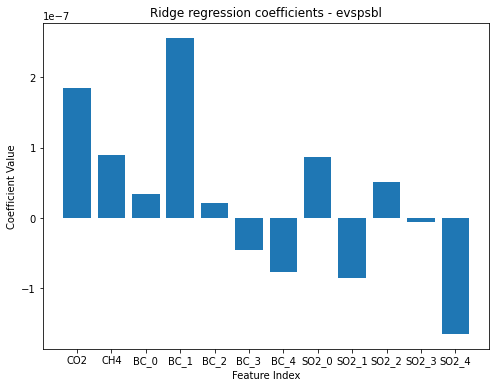

In [36]:
coefficients('evspsbl')

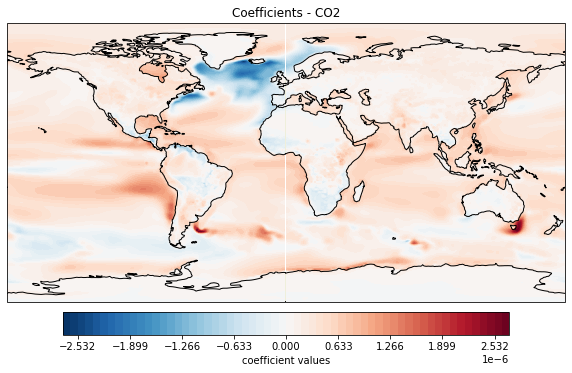

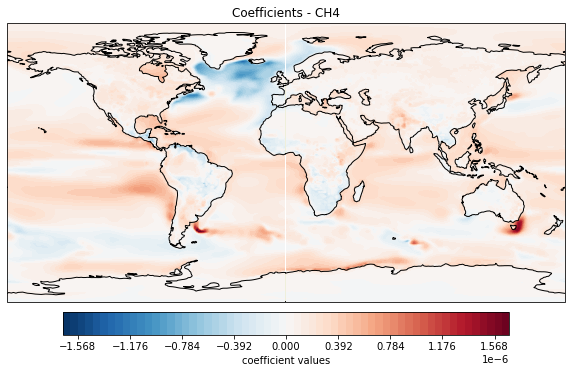

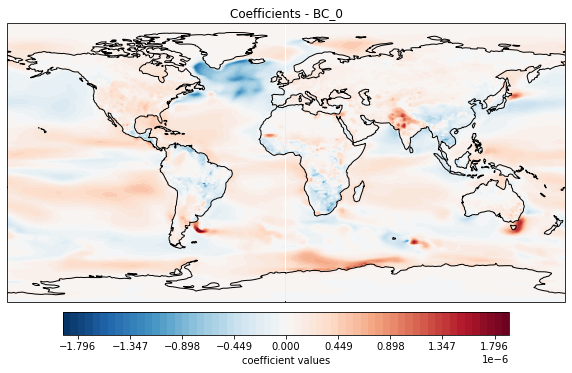

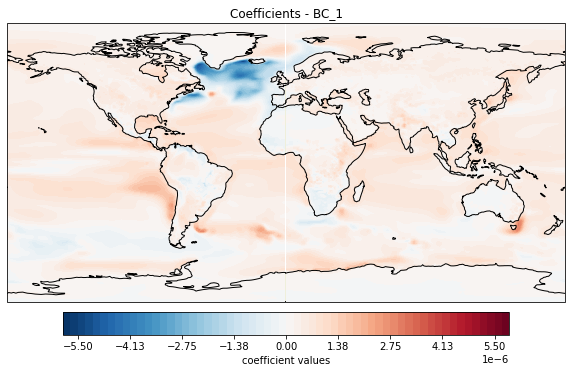

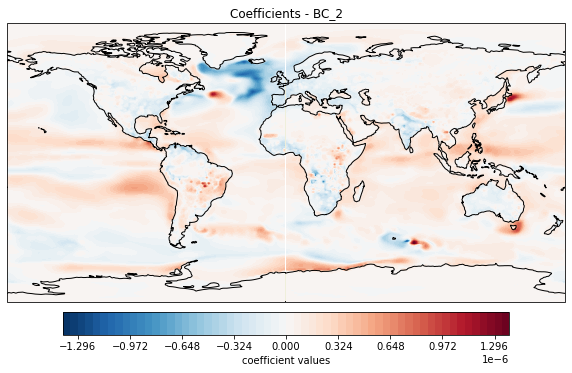

...

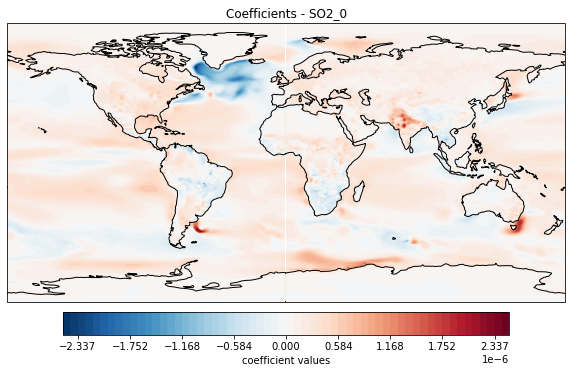

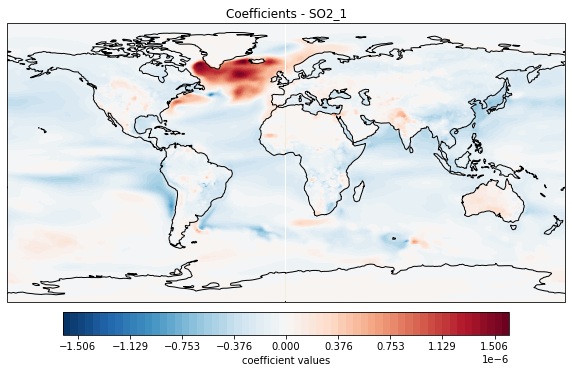

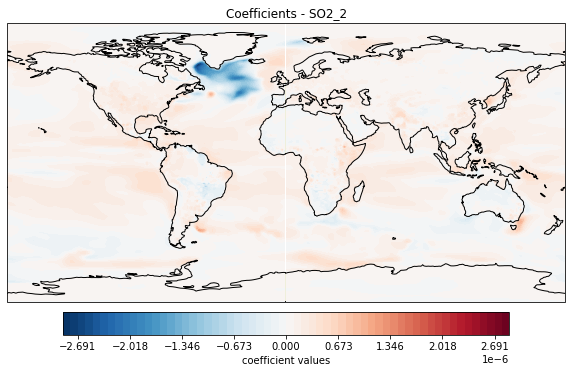

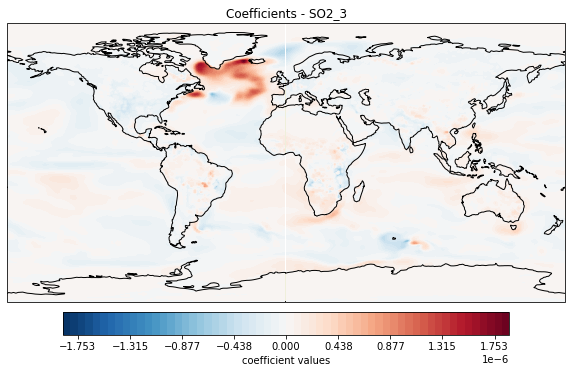

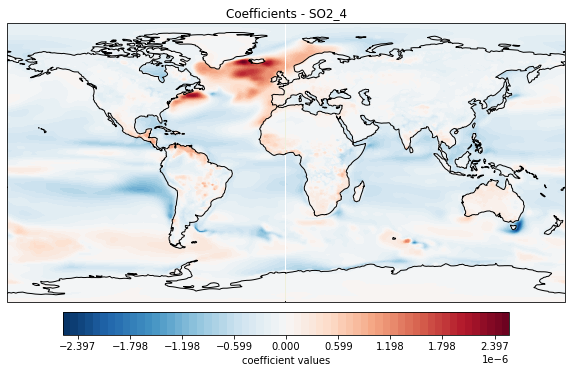

In [37]:
spatial_coefficients_plots('evspsbl')